In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mplt
import seaborn as sns
import arviz as az
import datetime

In [2]:
import fit_arima

In [3]:
import open_data
df_temp = open_data.open()
df = df_temp[0]

In [4]:
ritorno = fit_arima.compute(2, 1, catene=4, samples_per_chain=2500, burnin=1000)

20:26:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:33 - cmdstanpy - INFO - CmdStan done processing.
20:43:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: code_model_namespace::log_prob: phi[1][14] is 1, but must be less than or equal to 1.000000 (in '/home/br1/PythonProjects/PythonStats/ARIMA_last_computation/OnlyCovariates/code.stan', line 87, column 2 to column 47)
	Exception: code_model_namespace::log_prob: phi[1][18] is 1, but must be less than or equal to 1.000000 (in '/home/br1/PythonProjects/PythonStats/ARIMA_last_computation/OnlyCovariates/code.stan', line 87, column 2 to column 47)
	Exception: code_model_namespace::log_prob: phi[2][23] is 1, but must be less than or equal to 1.000000 (in '/home/br1/PythonProjects/PythonStats/ARIMA_last_computation/OnlyCovariates/code.stan', line 87, column 2 to column 47)
	Exception: code_model_namespace::log_prob: phi[1][4] is -nan, but must be greater than or equal to -1.000000 (in '/home/br1/PythonProjects/PythonStats/ARIMA_last_computation/OnlyCovariates/code.s

/home/br1/PythonProjects/PythonStats/ARIMA_last_computation/OnlyCovariates/fit_arima.py:41: FutureWarning: Indexing with a float is deprecated, and will raise an IndexError in pandas 2.0. You can manually convert to an integer key instead.
  y_missing_list.append({'Stazione':df.columns[v[i]],'Data':df.index[u[i]],'Samples':inference_data.posterior.w.values[:,:,i].reshape(catene*samples_per_chain)})


Tempo di computazione: 16:05

In [5]:
res = az.loo(ritorno['inference_data'], var_name="log_lik", pointwise=True, scale='deviance')
res

/home/br1/PythonProjects/PythonStats/.venv/lib/python3.10/site-packages/arviz/stats/stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Computed from 10000 posterior samples and 17191 observations log-likelihood matrix.

             Estimate       SE
deviance_loo -14500.04   310.21
p_loo          257.53        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     17102   99.5%
 (0.5, 0.7]   (ok)          76    0.4%
   (0.7, 1]   (bad)         13    0.1%
   (1, Inf)   (very bad)     0    0.0%

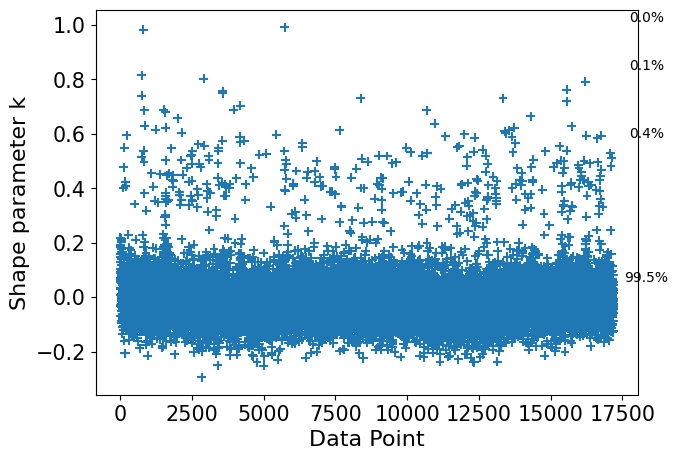

In [6]:
aux_plt = az.plot_khat(res, show_bins=True, figsize=(7,5))

In [7]:
res = az.waic(ritorno['inference_data'], var_name="log_lik", scale='deviance')
res

/home/br1/PythonProjects/PythonStats/.venv/lib/python3.10/site-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 10000 posterior samples and 17191 observations log-likelihood matrix.

              Estimate       SE
deviance_waic -14522.44   309.98
p_waic          246.33        -

There has been a warning during the calculation. Please check the results.

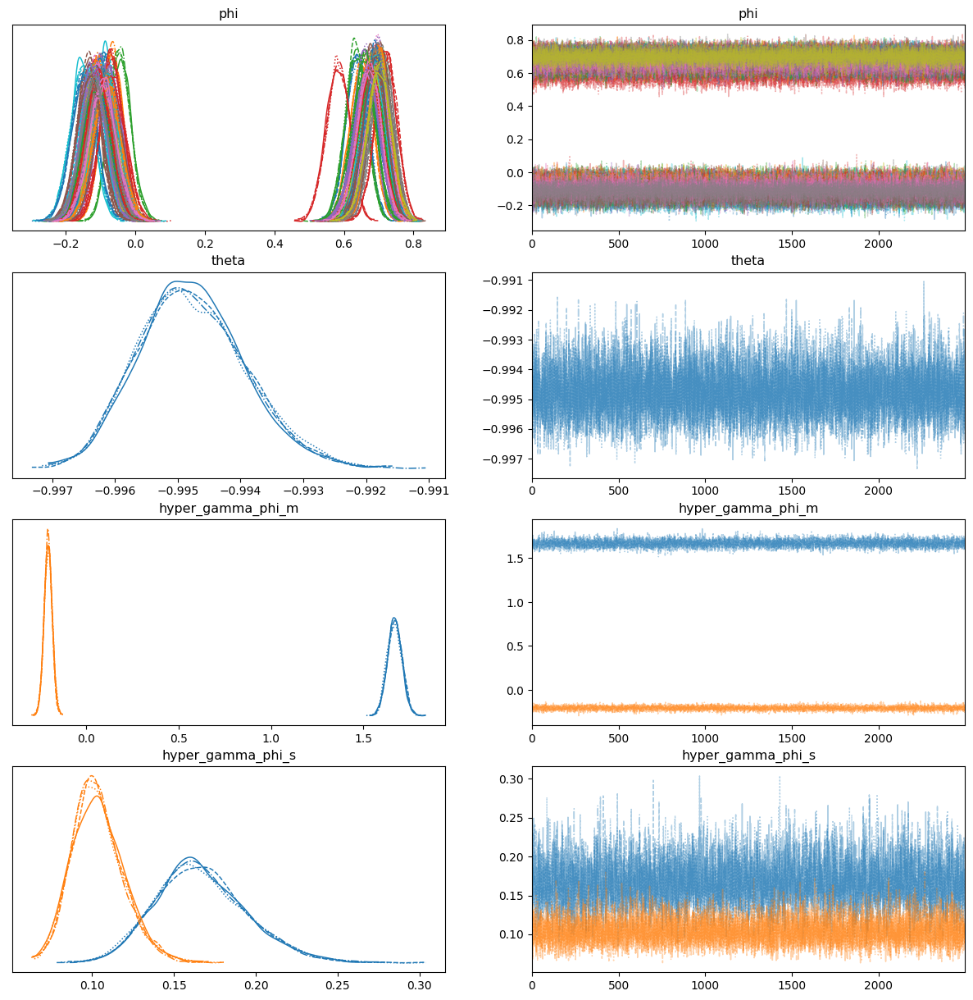

In [8]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['phi','theta','hyper_gamma_phi_m','hyper_gamma_phi_s'], divergences=True, figsize=(15,15))

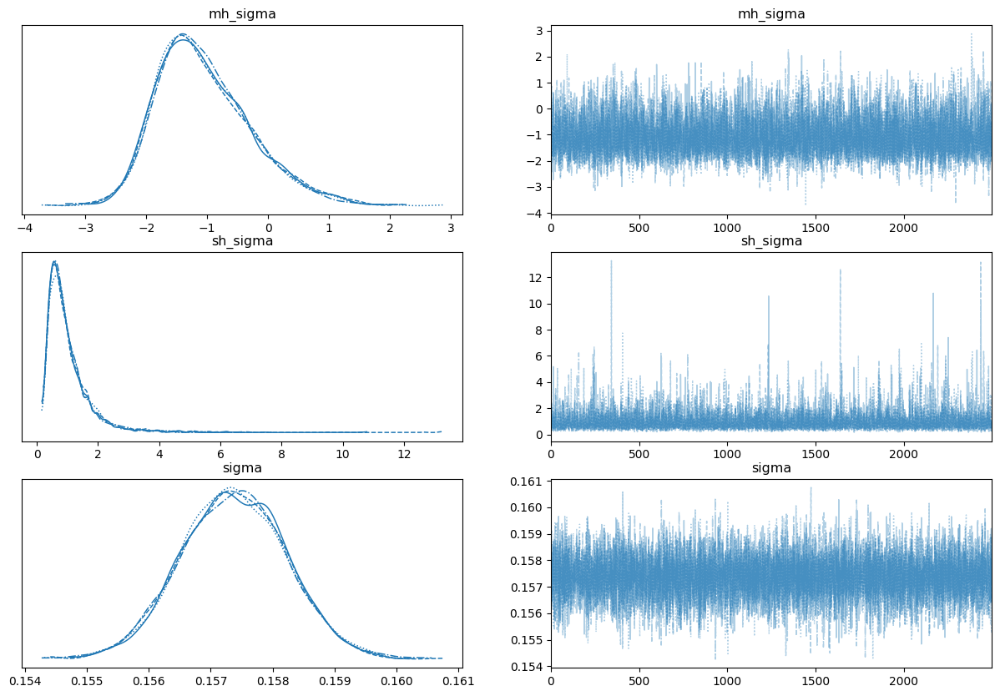

In [9]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['mh_sigma','sh_sigma','sigma'], divergences=True, figsize=(15,10))

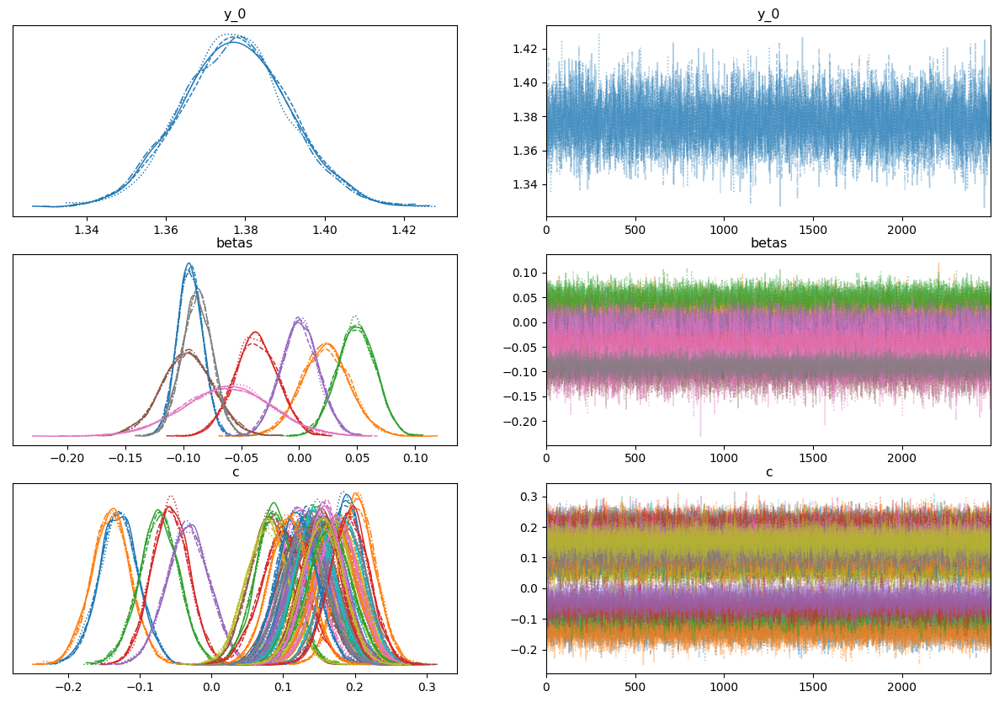

In [10]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['y_0','betas','c'], divergences=True, figsize=(15,10))

In [11]:
df_risultati = az.summary(ritorno['inference_data'], var_names=['betas'], hdi_prob=0.95)
df_risultati.loc[:,'Name'] = df_temp[1].columns
df_risultati.set_index('Name', inplace=True)
df_risultati

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Name,,,,,,,,,
Altitude,-0.094,0.011,-0.116,-0.073,0.0,0.0,11468.0,7201.0,1.0
Type_Industrial,0.023,0.021,-0.017,0.064,0.0,0.0,13914.0,7421.0,1.0
Type_Traffic,0.049,0.016,0.019,0.083,0.0,0.0,10027.0,7656.0,1.0
Type_Rural,-0.037,0.019,-0.074,-0.002,0.0,0.0,10059.0,7909.0,1.0
Type_SubUrban,0.000,0.016,-0.032,0.032,0.0,0.0,9407.0,7999.0,1.0
Zone_Agglomerato,-0.097,0.022,-0.140,-0.051,0.0,0.0,14890.0,8242.0,1.0
Zone_Appennino,-0.062,0.038,-0.140,0.008,0.0,0.0,11630.0,7796.0,1.0
Zone_Est,-0.088,0.013,-0.114,-0.063,0.0,0.0,11480.0,8199.0,1.0


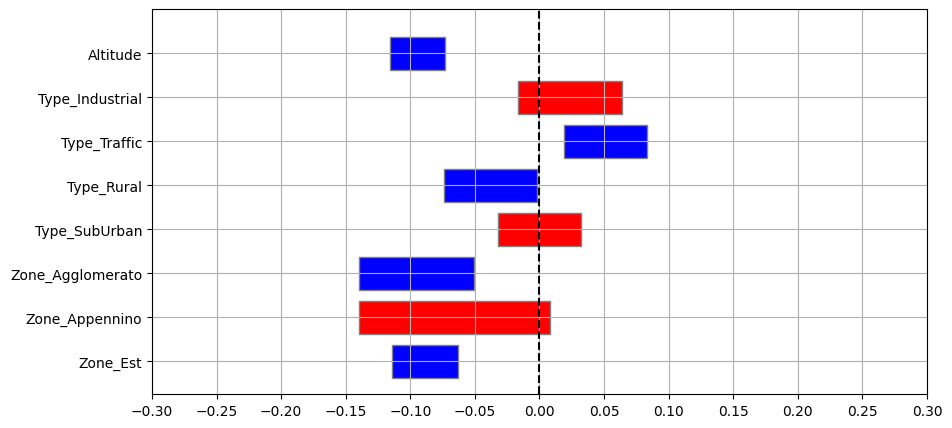

In [12]:
import time
from matplotlib.patches import Rectangle

plt.figure(figsize=(10,5))
ax = plt.subplot(1,1,1)
plt.xlim(left = -0.3, right = 0.3)
pos_rows = np.arange(0,len(df_risultati.index))
plt.ylim(bottom=-0.75, top=pos_rows[-1]+1.0)
i = 1
for row in df_risultati.index:    
    lci = df_risultati.loc[row, 'hdi_2.5%']
    rci = df_risultati.loc[row, 'hdi_97.5%']
    len_ci = rci - lci
    if lci*rci <= 0:
        col = 'red'
    else:
        col = 'blue'
    ax.add_patch(Rectangle((lci, pos_rows[-i] - 0.75/2), len_ci, 0.75,
             edgecolor = 'grey',
             facecolor = col,
             fill=True,
             lw=1))
    i += 1
    
    
plt.axvline(0, 0, pos_rows[-1]+0.75, linestyle='--', color='black')
plt.grid(axis='both')
plt.yticks(ticks=np.flip(pos_rows), labels=df_risultati.index.to_list())
plt.xticks(ticks=np.linspace(-0.3,0.3,13))
plt.show()

<AxesSubplot: ylabel='Density'>

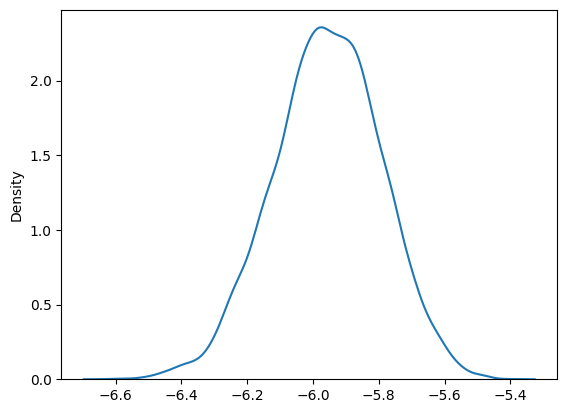

In [13]:
aux_shape = ritorno['inference_data'].posterior.gamma_th.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.gamma_th.values.reshape((aux_shape[0]*aux_shape[1])), legend=False)

<AxesSubplot: ylabel='Density'>

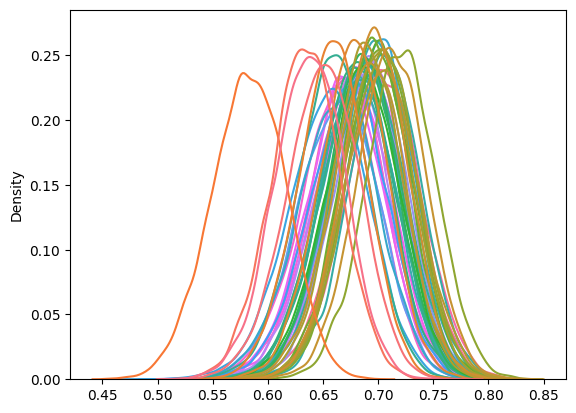

In [14]:
aux_shape = ritorno['inference_data'].posterior.phi.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.phi.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2],aux_shape[3]))[:,0,:], legend=False)

<AxesSubplot: ylabel='Density'>

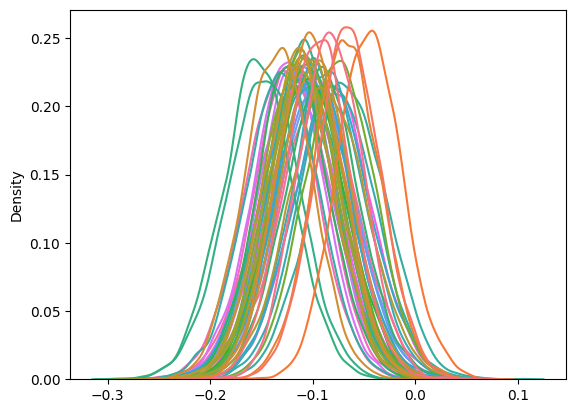

In [15]:
aux_shape = ritorno['inference_data'].posterior.phi.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.phi.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2],aux_shape[3]))[:,1,:], legend=False)

<AxesSubplot: ylabel='Density'>

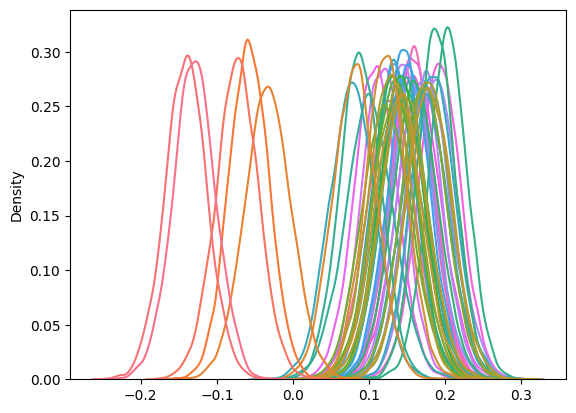

In [16]:
aux_shape = ritorno['inference_data'].posterior.c.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.c.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

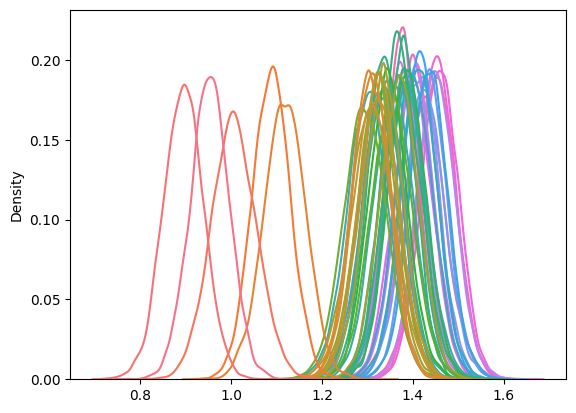

In [17]:
aux_shape = ritorno['inference_data'].posterior.annual_mean.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_mean.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

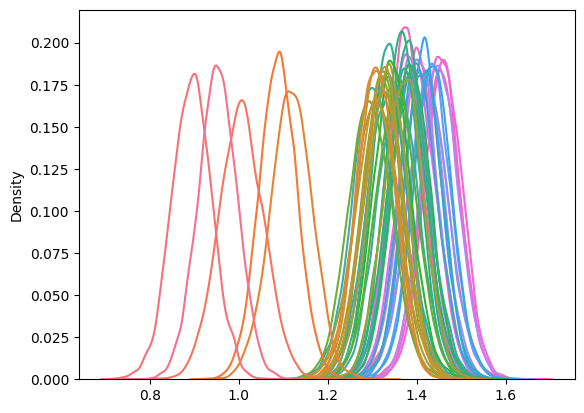

In [18]:
aux_shape = ritorno['inference_data'].posterior.annual_median.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_median.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

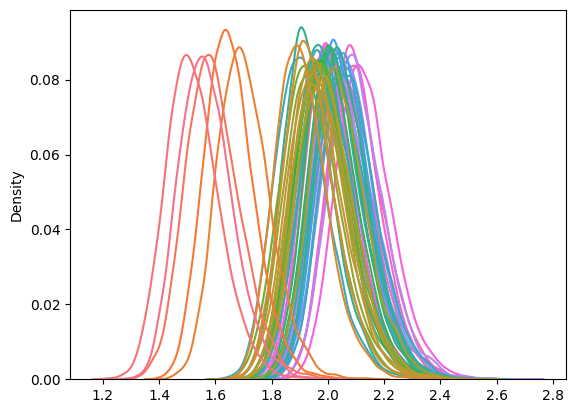

In [19]:
aux_shape = ritorno['inference_data'].posterior.annual_max.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_max.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

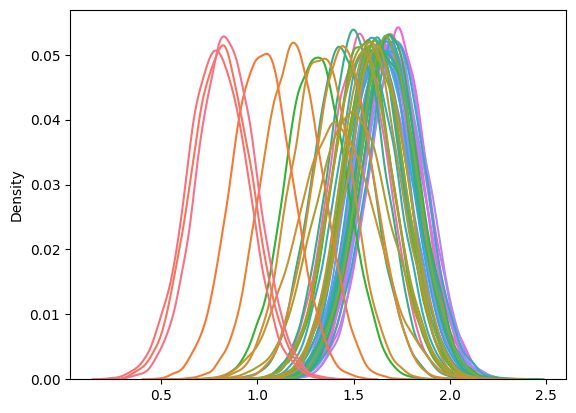

In [20]:
valori_31_dic = []
for dizionario in ritorno['missing']:
    if dizionario['Data'] == '2018-12-31':
        valori_31_dic.append(dizionario['Samples'])
        
res_plot = sns.kdeplot(valori_31_dic, legend=False)

<AxesSubplot: ylabel='Density'>

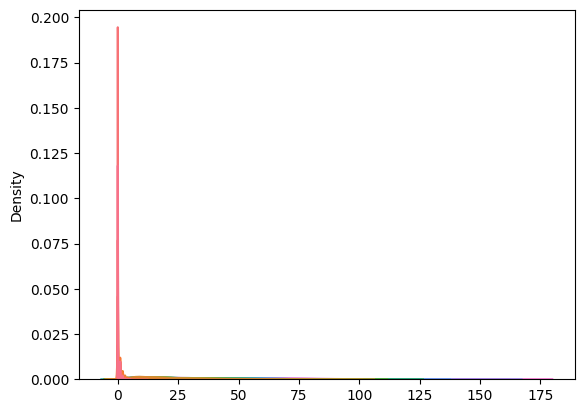

In [21]:
aux_shape = ritorno['inference_data'].posterior.annual_days_over_threshold.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_days_over_threshold.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

In [22]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.annual_days_over_threshold.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,FEBBIO,CASTELLUCCIO,CORTE BRUGNATELLA,SAVIGNANO DI RIGO,SAN LEO,VERUCCHIO,GHERARDI,SAN PIETRO CAPOFIUME,BADIA,DELTA CERVIA,VIA CHIARINI,GIARDINI MARGHERITA,MARECCHIA,FRANCHINI-ANGELONI,PARCO BERTOZZI,VILLA FULVIA,CAORLE,SAVIGNANO,LUGAGNANO,PARCO RESISTENZA,BESENZONE,CENTO,SAN LAZZARO,PORTA SAN FELICE,S. ROCCO,SAN FRANCESCO,GAVELLO,MALCANTONE,CASTELLARANO,ROMA,DE AMICIS,FLAMINIA,PARCO MONTECUCCO,ZALAMELLA,S. LAZZARO,ISONZO,PARCO EDILCARANI,CITTADELLA,SARAGAT,GERBIDO,PARADIGNA,BOGOLESE,REMESINA,PARCO FERRARI,CENO,MONTEBELLO,TIMAVO,GIORDANI-FARNESE,GIARDINI
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.0000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000
mean,0.04960,0.114400,0.192100,0.412800,0.958200,12.030600,12.050700,14.477200,14.981000,15.953300,16.672700,17.848700,19.847200,20.286800,20.618500,21.483500,21.752100,22.506800,22.719000,23.330200,24.035000,24.105700,24.598200,26.081700,27.340900,29.38250,30.602700,31.168300,31.333200,32.417300,32.769600,34.475200,34.592800,36.090000,36.704000,36.984900,37.046200,37.182800,39.434300,43.215500,43.287800,44.775300,44.9319,45.022600,45.428100,53.559800,54.039400,54.699200,61.42270
std,0.24443,0.394877,0.564296,0.807503,1.381247,6.969772,7.324718,8.627695,7.891303,8.311801,9.147783,9.575478,9.657235,10.022025,10.508616,10.170687,11.005833,10.409226,10.595757,10.749322,11.231722,10.999692,11.747602,11.669209,11.580168,11.41634,12.349037,13.210716,11.478578,13.392076,13.087125,13.747657,13.948285,14.349205,13.823462,13.672453,12.717069,13.720445,14.040384,16.784083,15.845324,15.829576,15.1831,15.192524,16.608811,16.625506,17.299109,17.465378,17.56339
min,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,2.00000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,2.000000,0.000000,5.000000,5.000000,1.000000,3.000000,2.000000,5.000000,4.000000,4.000000,4.0000,5.000000,6.000000,8.000000,9.000000,7.000000,14.00000
25%,0.00000,0.000000,0.000000,0.000000,0.000000,7.000000,7.000000,8.000000,9.000000,10.000000,10.000000,11.000000,13.000000,13.000000,13.000000,14.000000,14.000000,15.000000,15.000000,16.000000,16.000000,16.000000,16.000000,18.000000,19.000000,21.00000,22.000000,22.000000,23.000000,23.000000,23.000000,24.000000,25.000000,26.000000,27.000000,27.000000,28.000000,27.000000,29.000000,31.000000,32.000000,33.000000,34.0000,34.000000,33.000000,42.000000,42.000000,42.000000,49.00000
50%,0.00000,0.000000,0.000000,0.000000,0.000000,11.000000,11.000000,13.000000,14.000000,15.000000,15.000000,16.000000,18.000000,19.000000,19.000000,20.000000,20.000000,21.000000,21.000000,22.000000,22.000000,23.000000,23.000000,24.000000,26.000000,28.00000,29.000000,29.000000,30.000000,31.000000,31.000000,33.000000,33.000000,34.000000,35.000000,36.000000,36.000000,36.000000,38.000000,41.000000,42.000000,43.000000,43.0000,44.000000,44.000000,52.000000,53.000000,53.000000,60.00000
75%,0.00000,0.000000,0.000000,1.000000,1.000000,16.000000,16.000000,19.000000,19.000000,20.000000,22.000000,23.000000,25.000000,26.000000,27.000000,27.000000,28.000000,29.000000,29.000000,30.000000,30.000000,31.000000,31.000000,33.000000,34.000000,36.00000,38.000000,39.000000,38.000000,40.000000,41.000000,43.000000,43.000000,45.000000,45.000000,45.000000,45.000000,45.000000,48.000000,53.000000,53.000000,54.000000,54.0000,54.000000

In [23]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.is_over_daily_limit.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,FEBBIO,CORTE BRUGNATELLA,SAVIGNANO DI RIGO,SAN LEO,VERUCCHIO,GHERARDI,BADIA,SAN PIETRO CAPOFIUME,DELTA CERVIA,VIA CHIARINI,GIARDINI MARGHERITA,MARECCHIA,FRANCHINI-ANGELONI,PARCO BERTOZZI,VILLA FULVIA,CAORLE,SAVIGNANO,LUGAGNANO,PARCO RESISTENZA,CENTO,BESENZONE,SAN LAZZARO,PORTA SAN FELICE,S. ROCCO,SAN FRANCESCO,GAVELLO,MALCANTONE,CASTELLARANO,ROMA,DE AMICIS,PARCO MONTECUCCO,FLAMINIA,ZALAMELLA,S. LAZZARO,ISONZO,CITTADELLA,PARCO EDILCARANI,SARAGAT,GERBIDO,PARADIGNA,BOGOLESE,CENO,PARCO FERRARI,REMESINA,TIMAVO,MONTEBELLO,GIORDANI-FARNESE,GIARDINI
count,10000.0,10000.0,10000.0,10000.0,10000.0,10000.000000,10000.00000,10000.0000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.00000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000
mean,0.0,0.0,0.0,0.0,0.0,0.006600,0.00990,0.0184,0.02370,0.025400,0.040100,0.051700,0.067300,0.079200,0.089600,0.09500,0.109300,0.110000,0.118100,0.131200,0.143100,0.146900,0.163900,0.195900,0.220400,0.263700,0.307300,0.328800,0.328800,0.365900,0.374100,0.424400,0.427100,0.468600,0.490900,0.500300,0.507300,0.50920,0.578100,0.645700,0.660800,0.698800,0.70590,0.71430,0.716000,0.866500,0.86950,0.872700,0.944300
std,0.0,0.0,0.0,0.0,0.0,0.080976,0.09901,0.1344,0.15212,0.157345,0.196204,0.221432,0.250553,0.270064,0.285622,0.29323,0.312031,0.312905,0.322743,0.337636,0.350192,0.354024,0.370203,0.396912,0.414537,0.440661,0.461398,0.469801,0.469801,0.481706,0.483914,0.494276,0.494682,0.499038,0.499942,0.500025,0.499972,0.49994,0.493887,0.478325,0.473461,0.458802,0.45566,0.45177,0.450959,0.340131,0.33687,0.333325,0.229353
min,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.0000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.0000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,1.000000,1.00000,1.000000,1.000000
50%,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.0000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.00000,1.00000,1.000000,1.000000,1.00000,1.000000,1.000000
75%,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.0000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.00000,1.00000,1.000000,1.000000,1.00000,1.000000,1.000000
max,0.0,0.0,0.0,0.0,0.0,1.000000,1.00000,1.0000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.00000,1.0

<AxesSubplot: >

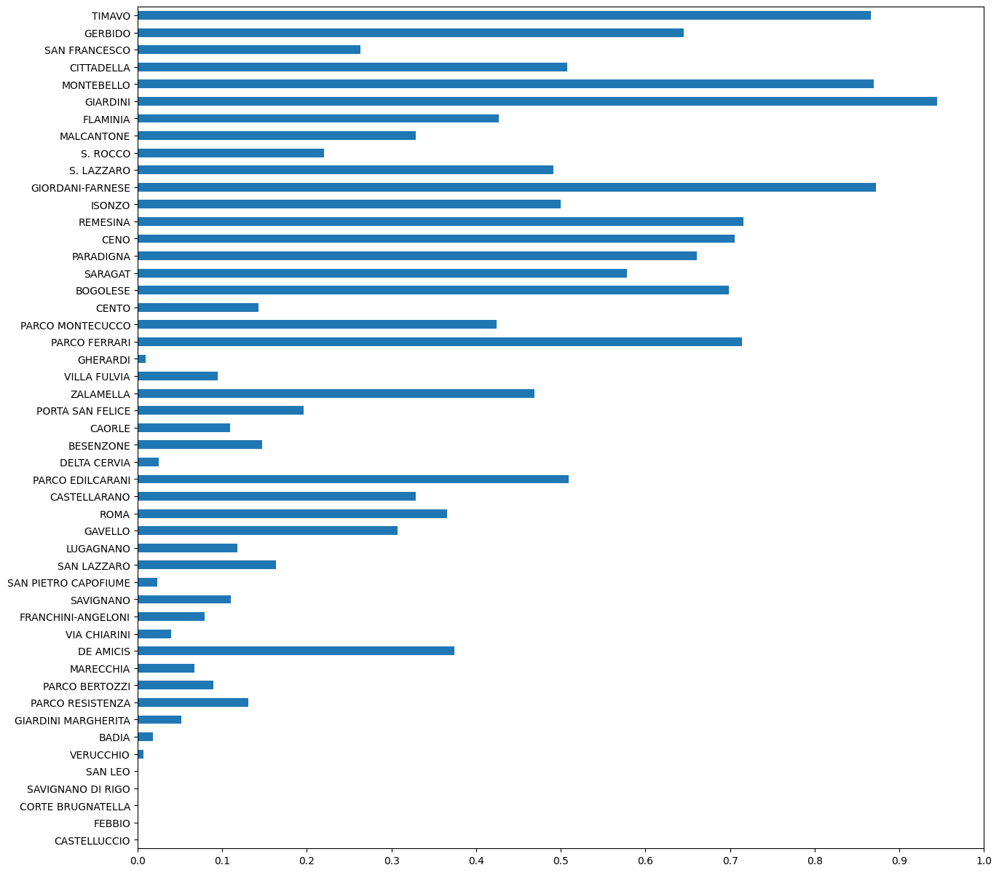

In [24]:
aux_results.loc['mean',:].plot(kind='barh', figsize=(15,15), xticks=np.linspace(0,1,11))
#res = plt.xticks(rotation = 30)

In [25]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.is_over_annual_limit.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,BESENZONE,PORTA SAN FELICE,ZALAMELLA,VILLA FULVIA,GHERARDI,PARCO FERRARI,PARCO MONTECUCCO,CENTO,DELTA CERVIA,BOGOLESE,CENO,ISONZO,S. LAZZARO,S. ROCCO,MALCANTONE,FLAMINIA,CITTADELLA,SAN FRANCESCO,SARAGAT,PARCO EDILCARANI,CAORLE,ROMA,FEBBIO,CORTE BRUGNATELLA,SAVIGNANO DI RIGO,SAN LEO,VERUCCHIO,BADIA,GIARDINI MARGHERITA,CASTELLARANO,PARCO BERTOZZI,PARCO RESISTENZA,DE AMICIS,VIA CHIARINI,FRANCHINI-ANGELONI,SAVIGNANO,SAN PIETRO CAPOFIUME,SAN LAZZARO,LUGAGNANO,GAVELLO,MARECCHIA,REMESINA,GERBIDO,PARADIGNA,MONTEBELLO,GIORDANI-FARNESE,GIARDINI,TIMAVO
count,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0000,10000.0000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0001,0.0001,0.000300,0.000400,0.000500,0.000500,0.000600
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0100,0.0100,0.017319,0.019997,0.022356,0.022356,0.024489
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0000,1.0000,1.000000,1.000000,1.000000,1.000000,1.000000


<AxesSubplot: >

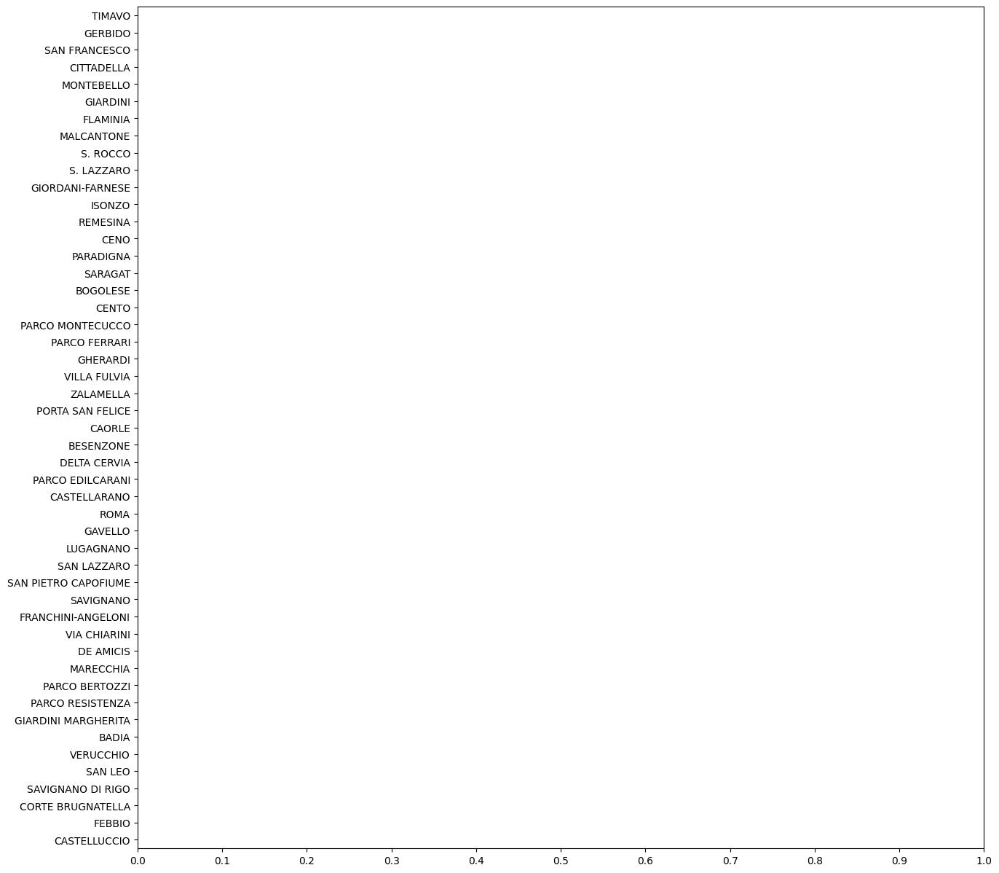

In [26]:
aux_results.loc['mean',:].plot(kind='barh', figsize=(15,15), xticks=np.linspace(0,1,11))
#res = plt.xticks(rotation = 30)

In [27]:
y_post_pred = ritorno['inference_data'].posterior.y_post_pred.to_numpy()
y_post_pred = y_post_pred.reshape(y_post_pred.shape[0]*y_post_pred.shape[1], y_post_pred.shape[2], y_post_pred.shape[3])
y_post_pred.shape

(10000, 365, 49)

In [28]:
import ipywidgets as widgets
from ipywidgets import HBox, VBox
from IPython.display import display

In [29]:
@widgets.interact(stazione = df.columns)
def f(stazione):
    col_map = sns.light_palette((20, 75, 70), input='husl', as_cmap=True)

    plt.figure(figsize=(14,8))
    ax = plt.subplot(1,1,1)

    idx_stazione = df.columns.to_list().index(stazione)
    
    """
    sns.lineplot(np.transpose(y_post_pred[0:50,:,idx_stazione]))
    """

    lower_lim = np.zeros(len(df.index))
    upper_lim = np.zeros(len(df.index))    
    for i in range(len(df.index)):
        lower_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],2.5)
        upper_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],97.5)
    
    
#    sns.lineplot(lower_lim)
#    sns.lineplot(upper_lim)
    
    for i in range(len(df.index)):
        ax.add_patch(mplt.patches.Rectangle((i,lower_lim[i]),1,upper_lim[i]-lower_lim[i], fill=True, color=col_map(180)))

    sns.lineplot(df[stazione])    
    sns.lineplot(np.mean(y_post_pred[:,:,idx_stazione], axis=0))


    index = 0
    for line in ax.get_lines():
        if index == 0:
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(155))
        else:
            col_map = sns.dark_palette((10,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
        index += 1
        
    plt.ylim(bottom=0,top=2.5)

    primo_giorno = datetime.date(2018,1,1)
    date_da_segnare = []
    date_da_segnare_posizioni = []

    for i in range(12):
        date_da_segnare.append(datetime.date(2018,i+1,1))
        date_da_segnare_posizioni.append((date_da_segnare[2*i] - primo_giorno).days)
        date_da_segnare.append(datetime.date(2018,i+1,15))
        date_da_segnare_posizioni.append((date_da_segnare[2*i+1] - primo_giorno).days)
        date_da_segnare[2*i] = date_da_segnare[2*i].isoformat()
        date_da_segnare[2*i+1] = date_da_segnare[2*i+1].isoformat()

    plt.xticks(date_da_segnare_posizioni,date_da_segnare,rotation=65)
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=True,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=True)
    plt.grid()
    
    """
    ax.get_legend().remove()
    col_vals = np.linspace(1,255,num=len(df.columns))
    index = 0
    for line in ax.get_lines():
        if(index == len(ax.get_lines()) - 1):
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            continue
        if(index == len(ax.get_lines()) - 2):
            col_map = sns.dark_palette((120,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            index += 1
            continue

        #line.set_c(col_map(int(np.round(col_vals[index]))))
        line.set_c(col_map(220))
        line.set_alpha(0.3)
        index += 1
    """
    
    

    plt.show()

interactive(children=(Dropdown(description='stazione', options=('CASTELLUCCIO', 'FEBBIO', 'CORTE BRUGNATELLA',…

In [30]:
def f(stazione):
    col_map = sns.light_palette((20, 75, 70), input='husl', as_cmap=True)

    plt.figure(figsize=(14,8))
    ax = plt.subplot(1,1,1)

    idx_stazione = df.columns.to_list().index(stazione)
    
    """
    sns.lineplot(np.transpose(y_post_pred[0:50,:,idx_stazione]))
    """

    lower_lim = np.zeros(len(df.index))
    upper_lim = np.zeros(len(df.index))    
    for i in range(len(df.index)):
        lower_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],2.5)
        upper_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],97.5)
    
    
#    sns.lineplot(lower_lim)
#    sns.lineplot(upper_lim)
    
    for i in range(len(df.index)):
        ax.add_patch(mplt.patches.Rectangle((i,lower_lim[i]),1,upper_lim[i]-lower_lim[i], fill=True, color=col_map(180)))

    sns.lineplot(df[stazione])    
    sns.lineplot(np.mean(y_post_pred[:,:,idx_stazione], axis=0))


    index = 0
    for line in ax.get_lines():
        if index == 0:
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(155))
        else:
            col_map = sns.dark_palette((10,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
        index += 1
        
    plt.ylim(bottom=0,top=2.5)

    primo_giorno = datetime.date(2018,1,1)
    date_da_segnare = []
    date_da_segnare_posizioni = []

    for i in range(12):
        date_da_segnare.append(datetime.date(2018,i+1,1))
        date_da_segnare_posizioni.append((date_da_segnare[2*i] - primo_giorno).days)
        date_da_segnare.append(datetime.date(2018,i+1,15))
        date_da_segnare_posizioni.append((date_da_segnare[2*i+1] - primo_giorno).days)
        date_da_segnare[2*i] = date_da_segnare[2*i].isoformat()
        date_da_segnare[2*i+1] = date_da_segnare[2*i+1].isoformat()

    plt.xticks(date_da_segnare_posizioni,date_da_segnare,rotation=65)
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=True,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=True)
    plt.grid()
    
    """
    ax.get_legend().remove()
    col_vals = np.linspace(1,255,num=len(df.columns))
    index = 0
    for line in ax.get_lines():
        if(index == len(ax.get_lines()) - 1):
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            continue
        if(index == len(ax.get_lines()) - 2):
            col_map = sns.dark_palette((120,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            index += 1
            continue

        #line.set_c(col_map(int(np.round(col_vals[index]))))
        line.set_c(col_map(220))
        line.set_alpha(0.3)
        index += 1
    """
    
    

    plt.show()

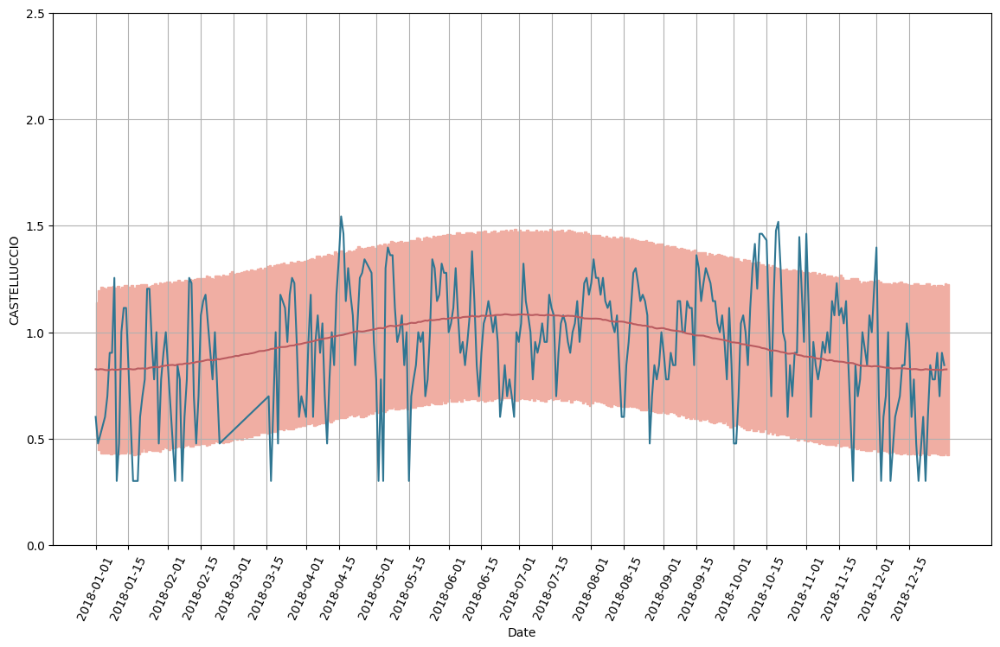

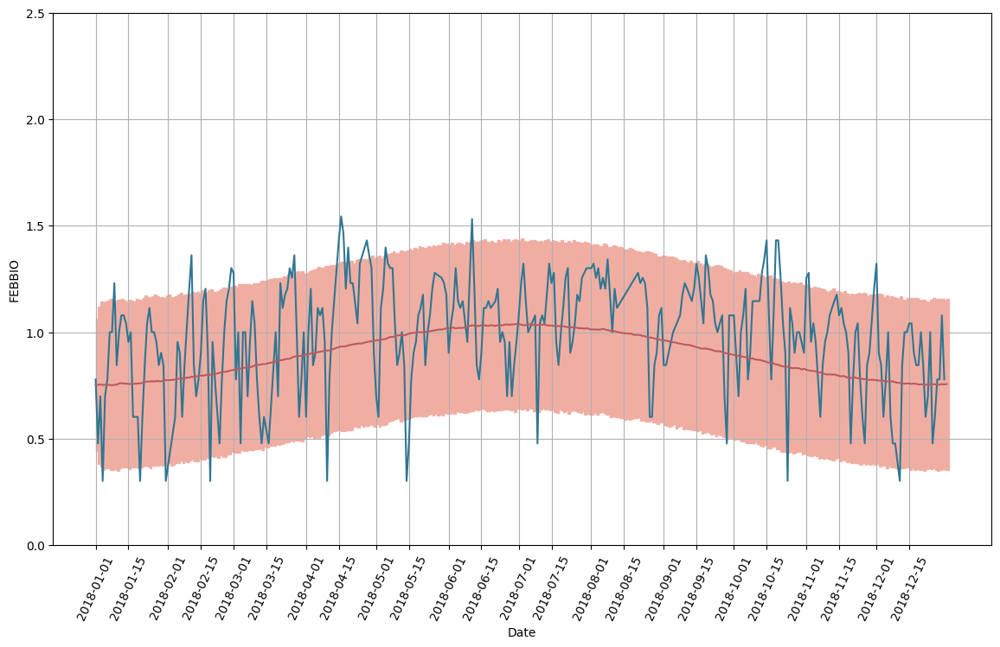

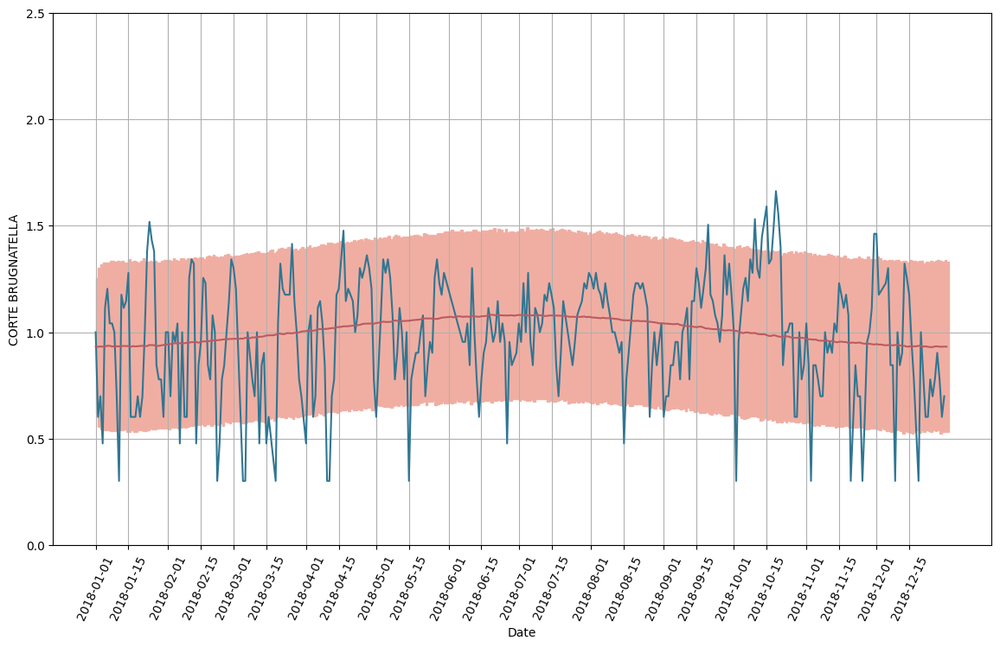

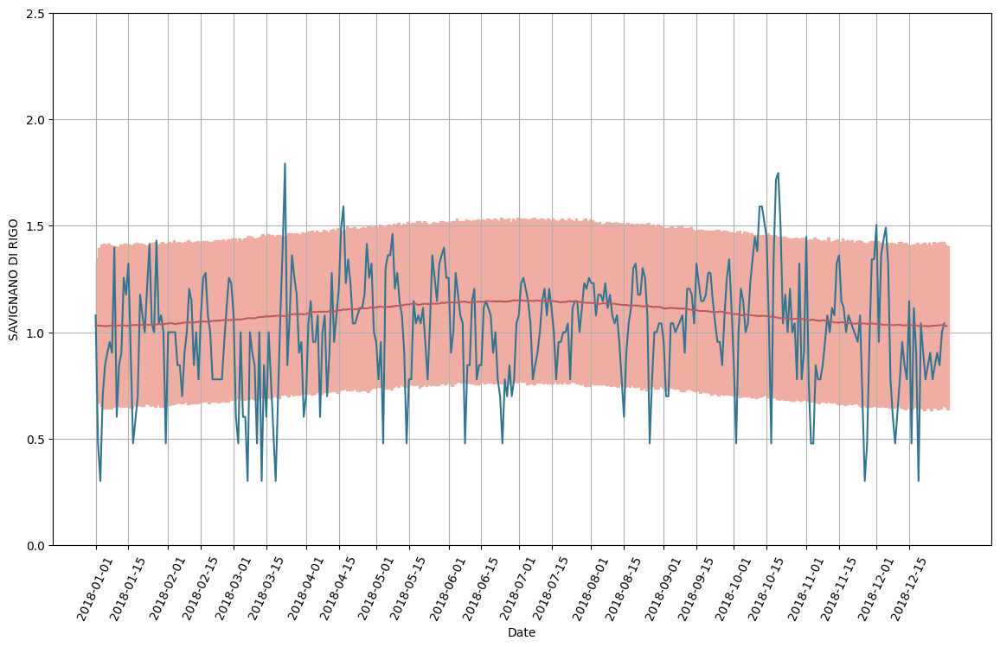

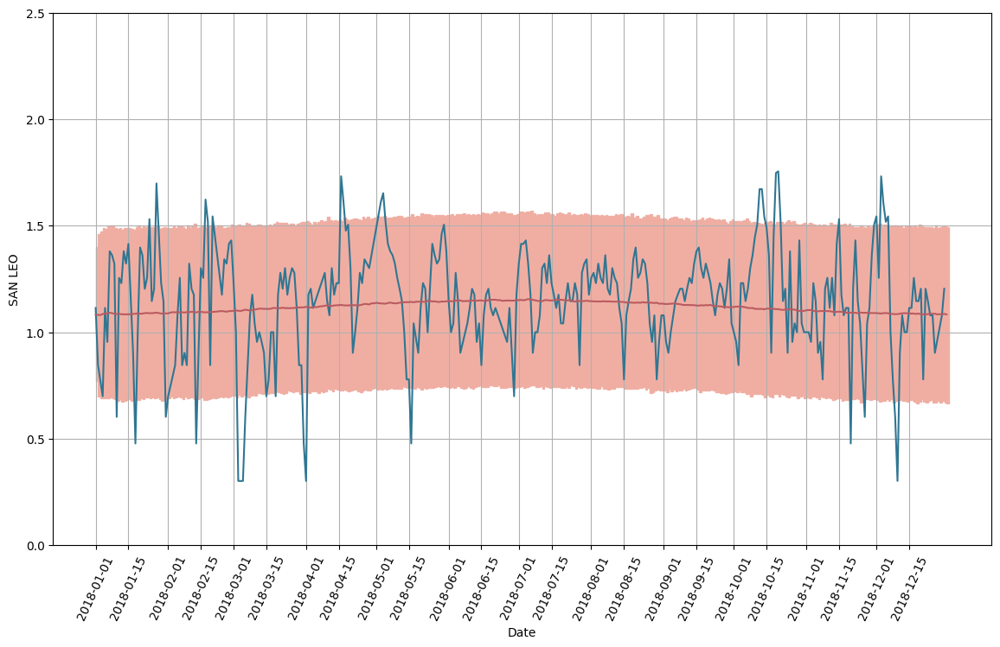

...

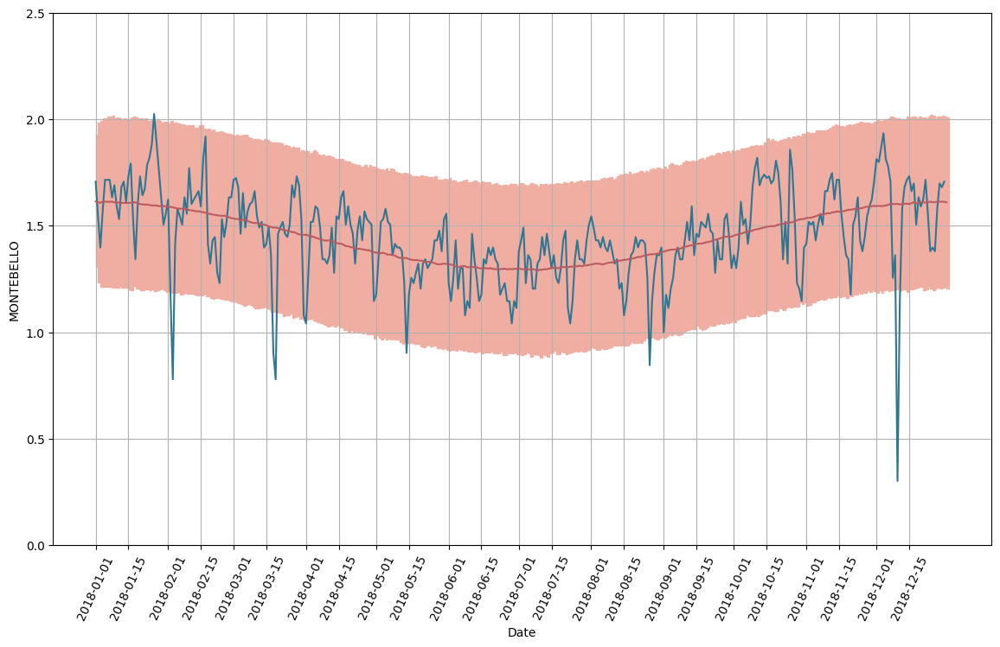

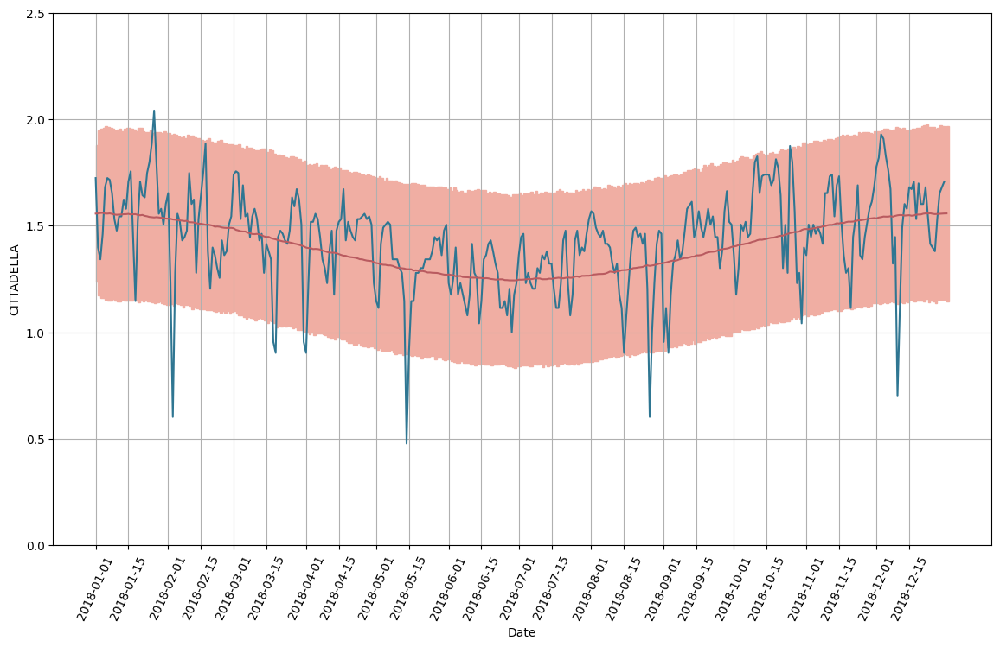

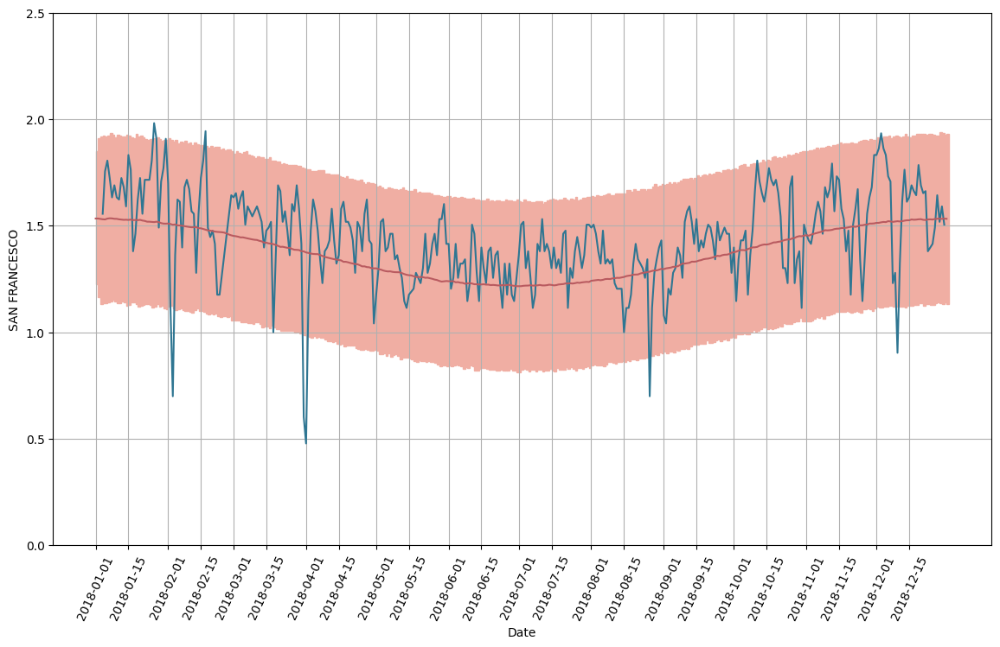

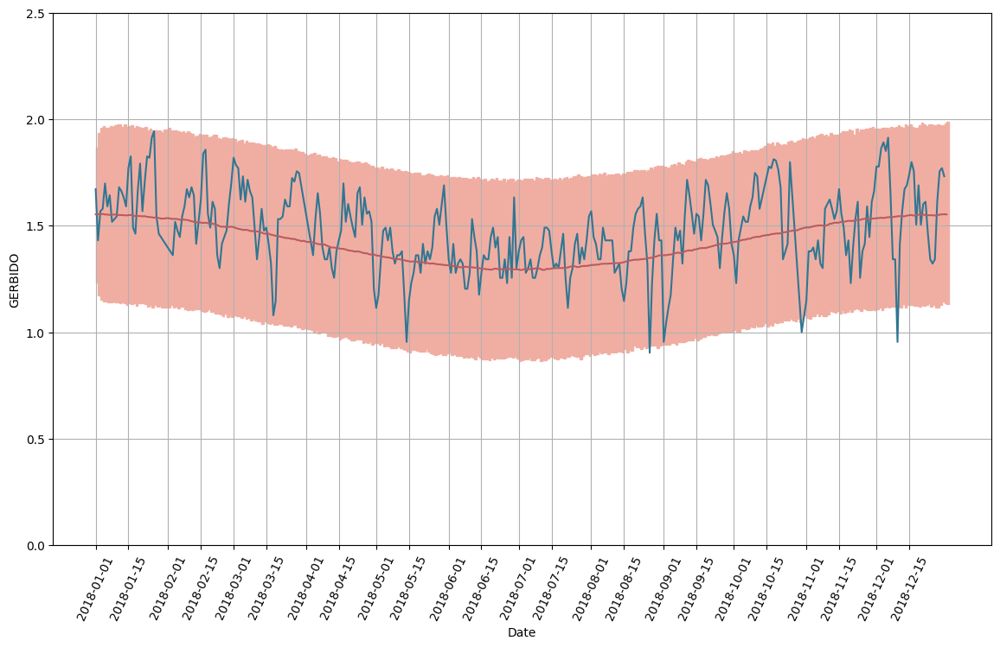

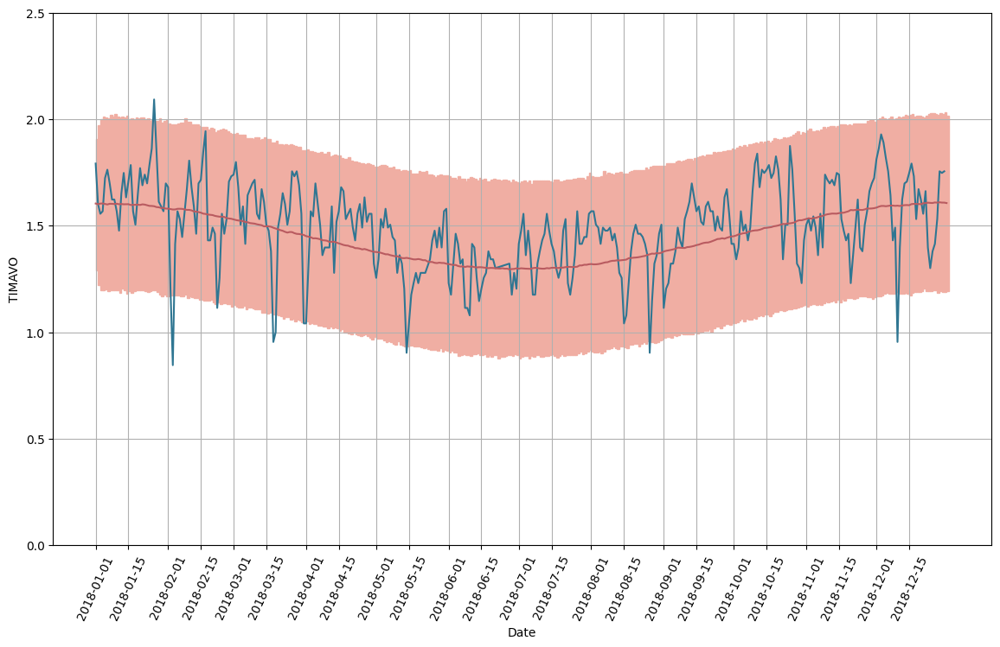

In [31]:
for stazione in df.columns:
    f(stazione)